In [1]:
# EDA for fish image classification project

# The dataset was sourced from kaggle.com; citation is denoted below
#   title={A Large-Scale Dataset for Fish Segmentation and Classification},
#   author={Ulucan, Oguzhan and Karakaya, Diclehan and Turkan, Mehmet},
#   booktitle={2020 Innovations in Intelligent Systems and Applications Conference (ASYU)},
#   pages={1--5},
#   year={2020},
#   organization={IEEE}

# Importing the required libraries/packages
import numpy as np
import datetime as datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as image
import random
import os
import glob
import cv2
import pathlib 
import tensorflow as tf

# reading in the datasets and splitting into "Ground Truth" and targeted "Training Data"

abs_path = '/Users/alexanderblaies/Desktop/SpringboardAssignments/Capstone Projects/3rdCapRepo/data/Fish Dataset Project/Fish_Dataset'

# defining the absolute path; for the relative path use ('.')
data_path = pathlib.Path(abs_path)

# confirming the directory path
data_path.is_dir()

True

In [2]:
# returning a list of all sub folder names within the directory; these will be the label names
labels = [os.path.basename(x) for x in glob.glob(abs_path + '/*', recursive=True)]

# alternatively, could use os.listdir(abs_path), but that also returns a jupyter notebook checkpoint 
labels

['Sea Bass',
 'Red Mullet',
 'Gilt-Head Bream',
 'Red Sea Bream',
 'Shrimp',
 'Black Sea Sprat',
 'Striped Red Mullet',
 'Hourse Mackerel',
 'Trout']

In [3]:
# using the labels to gain access to the pictures via pathway construction (example is below)
# '/Users/alexanderblaies/Desktop/SpringboardAssignments/Capstone Projects/
#  3rdCapRepo/data/Fish Dataset Project/Fish_Dataset/Sea Bass/Sea Bass
#  need to duplicate each label and then extract the list of images to create a dataframe with the label
#  and a list of all images

images_pathway = [abs_path + (2 *('/' + fishname)) + '/' for fishname in labels]
seabass_images_list = sorted(os.listdir(images_pathway[0]))

# example of a list of images within the Sea Bass directory
print(images_pathway[0], seabass_images_list[0:5])

/Users/alexanderblaies/Desktop/SpringboardAssignments/Capstone Projects/3rdCapRepo/data/Fish Dataset Project/Fish_Dataset/Sea Bass/Sea Bass/ ['00001.png', '00002.png', '00003.png', '00004.png', '00005.png']


In [4]:
# putting the above cell together and constructing a dataframe with labels and their associated images 
# could've done a nested for loop instead, but list comprehension is much faster
images_list = [abs_path + (2 *('/' + fishname)) + '/' + i for fishname in labels 
               for i in sorted(os.listdir(abs_path + (2 *('/' + fishname))))]

image_df = pd.DataFrame(images_list).rename(columns = {0:'Image_Pathway'})
image_df['Label'] = [pathway.split("/")[-2] for pathway in image_df.Image_Pathway]
image_df.head(5)

,Image_Pathway,Label
0,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
1,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
2,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
3,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass
4,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass


In [5]:
# looks good to me
image_df.describe()

,Image_Pathway,Label
count,9000,9000
unique,9000,9
top,/Users/alexanderblaies/Desktop/SpringboardAssi...,Gilt-Head Bream
freq,1,1000


In [6]:
# double checking to ensure that the labels were properly applied
image_df.Label.value_counts()

Gilt-Head Bream       1000
Red Mullet            1000
Black Sea Sprat       1000
Shrimp                1000
Red Sea Bream         1000
Striped Red Mullet    1000
Trout                 1000
Hourse Mackerel       1000
Sea Bass              1000
Name: Label, dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

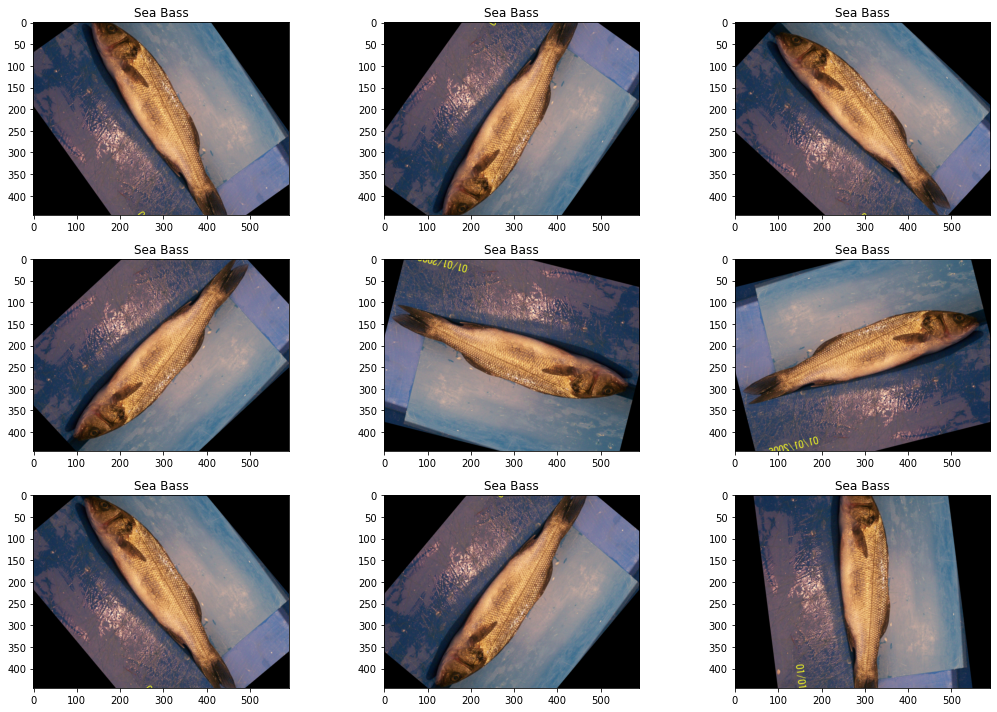

In [7]:
# now it's time to go ahead and sample the Sea Bass Images to better understand what type of contexts are included
# hence, are we accounting for a change in lighting, orientation, cropping, background imaging, etc?
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,10))

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Image_Pathway[i]))
    ax.set_title(image_df.Label[i])

plt.tight_layout()
plt.show

# it looks like we are accounting for a few different perspectives here; because the images are relatively clean, 
# we may not be accounting for a lot of variability; so, this should be relatively straightforward

<function matplotlib.pyplot.show(close=None, block=None)>

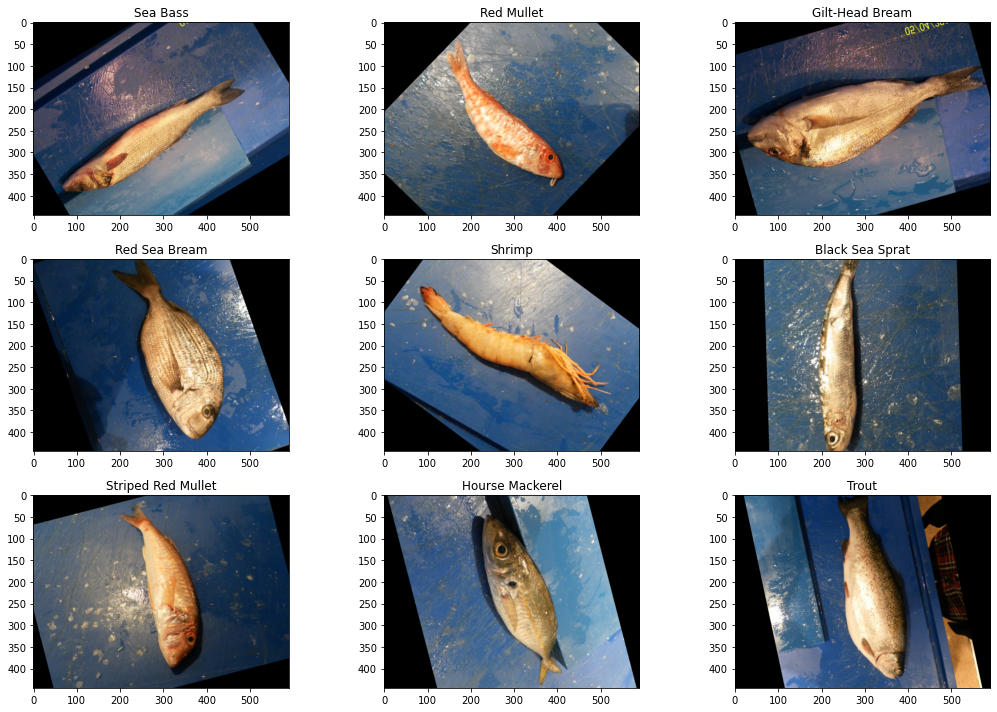

In [8]:
# now, let's look at one of each type of fish 
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize = (15,10))

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Image_Pathway[(i + 1) * 999]))
    ax.set_title(image_df.Label[(i + 1) * 999])

plt.tight_layout()
plt.show

DataPrep Report
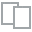
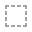
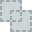
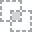
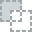
...
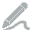
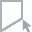
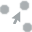
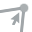
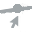

In [9]:
# found this online.. pretty neat summary of the data without having to code 
from dataprep.eda import create_report
create_report(image_df)

In [ ]:
# other additional eda ideas to potentially enhance the model's performance: outlier detection, visualizing the lighting
# and other components via analyzing the color distribution

In [10]:
# time for preprocessing
# creating a train and testing split
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(image_df, train_size = 0.7, shuffle = True, random_state = 49)
print(train_df.shape, test_df.shape)

(6300, 2) (2700, 2)


In [11]:
test_df.columns

Index(['Image_Pathway', 'Label'], dtype='object')

In [12]:
# time to load the images and utilize the ImageDataGenerator

from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(validation_split = 0.25)
test_generator = ImageDataGenerator()


In [13]:
# creating a training set, validation of the training set and test set for evaluation

training_images = train_generator.flow_from_dataframe(dataframe = train_df, x_col = "Image_Pathway", y_col = "Label"
                 , class_mode = 'categorical', target_size = (256, 256), color_mode = "rgb", batch_size = 50, shuffle = False
                 , seed = 45, subset = "training")

train_val_images = train_generator.flow_from_dataframe(dataframe = train_df, x_col = "Image_Pathway", y_col = "Label"
                 , class_mode = 'categorical', target_size = (256, 256), color_mode = "rgb", batch_size = 50, shuffle = False
                 , seed = 45, subset = "validation")

test_images = test_generator.flow_from_dataframe(dataframe = test_df, x_col = "Image_Pathway", y_col = "Label"
                 , class_mode = 'categorical', target_size = (256, 256), color_mode = "rgb", batch_size = 50, shuffle = False
                 , seed = 45)


Found 4725 validated image filenames belonging to 9 classes.
Found 1575 validated image filenames belonging to 9 classes.
Found 2700 validated image filenames belonging to 9 classes.


In [14]:
# checking out the classes to ensure everything is consistent between the training, validation and test datasets
training_images.class_indices

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

In [15]:
train_val_images.class_indices

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

In [16]:
test_images.class_indices

{'Black Sea Sprat': 0,
 'Gilt-Head Bream': 1,
 'Hourse Mackerel': 2,
 'Red Mullet': 3,
 'Red Sea Bream': 4,
 'Sea Bass': 5,
 'Shrimp': 6,
 'Striped Red Mullet': 7,
 'Trout': 8}

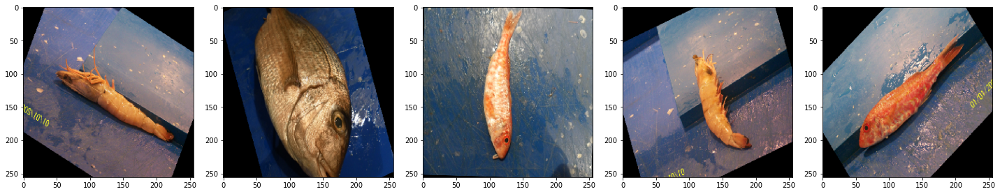

In [17]:
# visualizing the augmentation of the training dataset
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img.astype('uint8'))
    plt.tight_layout()
    plt.show()
    
    
augmented_images = [training_images[0][0][i+5] for i in range(5)]
plotImages(augmented_images)

In [18]:
# initializing the modelling 

from tensorflow.keras import layers,models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.applications import mobilenet_v2

model = Sequential()
model.add(Conv2D(64, (3,3), activation = "relu", input_shape = (256, 256, 3)))
model.add(MaxPooling2D((2,2)))

model.add(Conv2D(128, (3,3), activation = "relu"))
model.add(MaxPooling2D((2,2)))

model.add(Conv2D(256, (3,3), activation = "relu"))
model.add(MaxPooling2D((2,2)))

model.add(Flatten())

model.add(Dense(128, activation = "relu"))
model.add(Dropout(0.3))

model.add(Dense(128, activation = "relu"))
model.add(Dropout(0.3))

model.add(Dense(9, activation = "softmax"))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 254, 254, 64)      1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 127, 127, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 125, 125, 128)     73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 62, 62, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 256)       295168    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 30, 30, 256)       0         
_________________________________________________________________
flatten (Flatten)            (None, 230400)            0

In [19]:
# ability to leverage the pretrained model via MobileNet, but this is pretty straightforward, so I'll do the training on
# my own
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=X, weights='imagenet', pooling='avg')
# pretrained_model.trainable = False

In [20]:
# training the model 
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

model.compile(optimizer = "adam", loss = "categorical_crossentropy", metrics = ["accuracy"])

history = model.fit(training_images,
    validation_data=train_val_images,
    steps_per_epoch = 20,
    epochs = 25, 
    callbacks=[EarlyStopping(monitor='val_loss', patience = 10, restore_best_weights = True)])

Epoch 1/25
20/20 [==============================] - 223s 11s/step - loss: 59.8392 - accuracy: 0.1949 - val_loss: 1.9908 - val_accuracy: 0.3454
Epoch 2/25
20/20 [==============================] - 258s 13s/step - loss: 1.9293 - accuracy: 0.3250 - val_loss: 1.7102 - val_accuracy: 0.4222
Epoch 3/25
20/20 [==============================] - 223s 11s/step - loss: 1.7243 - accuracy: 0.3810 - val_loss: 1.4344 - val_accuracy: 0.5003
Epoch 4/25
20/20 [==============================] - 203s 10s/step - loss: 1.5356 - accuracy: 0.4410 - val_loss: 1.1922 - val_accuracy: 0.6076
Epoch 5/25
20/20 [==============================] - 203s 10s/step - loss: 1.3530 - accuracy: 0.5140 - val_loss: 0.9609 - val_accuracy: 0.6870
Epoch 6/25
20/20 [==============================] - 205s 10s/step - loss: 1.1525 - accuracy: 0.5770 - val_loss: 0.8586 - val_accuracy: 0.7333
Epoch 7/25
20/20 [==============================] - 214s 11s/step - loss: 1.0564 - accuracy: 0.6328 - val_loss: 0.6930 - val_accuracy: 0.8025
Epoch

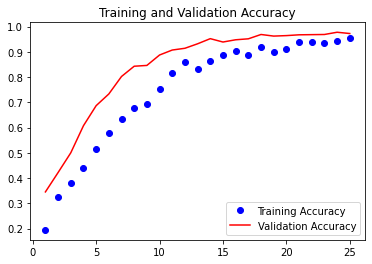

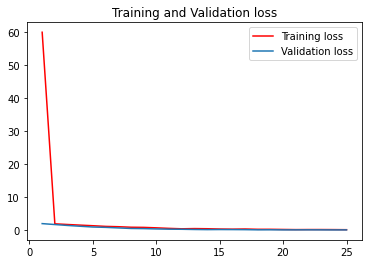

In [21]:
# plotting the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()

plt.show()

In [22]:
# applying the trained model and making predictions
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.10351
Test Accuracy: 97.07%


In [23]:
y_pred = model.predict(test_images)
y_pred = np.argmax(y_pred,axis=1)

<AxesSubplot:>

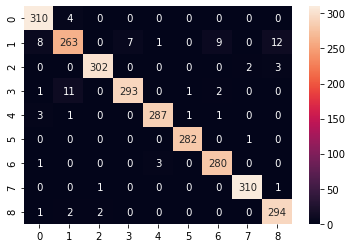

In [24]:
# classification report and confusion matrix to analyze the individual species
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns

pred_df = test_df.copy()
labels = {}
for l,v in test_images.class_indices.items():
    labels.update({v:l})
pred_df['pred'] = y_pred
pred_df['pred'] = pred_df['pred'].apply(lambda x: labels[x])
    
sns.heatmap(confusion_matrix(pred_df['Label'],pred_df['Pred']), annot=True, fmt='2d')

In [25]:
# general inspection.. one incorrect value
pred_df.head(25)

,Image_Pathway,Label,pred
2952,/Users/alexanderblaies/Desktop/SpringboardAssi...,Gilt-Head Bream,Shrimp
5624,/Users/alexanderblaies/Desktop/SpringboardAssi...,Black Sea Sprat,Black Sea Sprat
49,/Users/alexanderblaies/Desktop/SpringboardAssi...,Sea Bass,Sea Bass
4668,/Users/alexanderblaies/Desktop/SpringboardAssi...,Shrimp,Shrimp
2504,/Users/alexanderblaies/Desktop/SpringboardAssi...,Gilt-Head Bream,Gilt-Head Bream
7484,/Users/alexanderblaies/Desktop/SpringboardAssi...,Hourse Mackerel,Hourse Mackerel
6942,/Users/alexanderblaies/Desktop/SpringboardAssi...,Striped Red Mullet,Striped Red Mullet
5469,/Users/alexanderblaies/Desktop/SpringboardAssi...,Black Sea Sprat,Black Sea Sprat
6973,/Users/alexanderblaies/Desktop/SpringboardAssi...,Striped Red Mullet,Striped Red Mullet
8640,/Users/alexanderblaies/Desktop/SpringboardAssi...,Trout,Trout


In [2]:
from sklearn.metrics import classification_report
print(classification_report(pred_df['Label'],pred_df['Pred']))

NameError: name 'pred_df' is not defined